In [ ]:
# ! pip install -q kaggle

In [ ]:
# pip install pandas-profiling

In [ ]:
from google.colab import files

In [ ]:
files.upload()

{}

In [ ]:
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
! mkdir ~/.kaggle

In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets list

ref                                                            title                                             size  lastUpdated          downloadCount  voteCount  usabilityRating  
-------------------------------------------------------------  -----------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
alphiree/cardiovascular-diseases-risk-prediction-dataset       Cardiovascular Diseases Risk Prediction Dataset    5MB  2023-07-03 12:12:19           3682        156  1.0              
nelgiriyewithana/countries-of-the-world-2023                   Global Country Information Dataset 2023           23KB  2023-07-08 20:37:33           2606         94  1.0              
arnavsmayan/netflix-userbase-dataset                           Netflix Userbase Dataset                          25KB  2023-07-04 07:38:41           3771         77  1.0              
iamsouravbanerjee/data-science-salaries-2023                   Latest Data Scien

In [ ]:
!kaggle datasets download -d ahmedadam415/digital-currency-time-series

  0% 0.00/40.3k [00:00<?, ?B/s]
100% 40.3k/40.3k [00:00<00:00, 1.95MB/s]


In [ ]:
!unzip -q "/content/digital-currency-time-series.zip" -d "/content/sample_data"

replace /content/sample_data/dc.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y


In [ ]:
import pandas as pd
import numpy as np
import pandas as pd
import itertools
import numpy as np
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import train_test_split
from split_data import *
df = pd.read_csv("/content/sample_data/dc.csv")
# df.index = pd.to_datetime(df.index)
df.head()

,Unnamed: 0,open_SAR,open_USD,high_SAR,high_USD,low_SAR,low_USD,close_SAR,close_USD,volume
0,2021-01-30,128437.248512,34246.28,131012.723200,34933.00,123106.880000,32825.00,128333.212416,34218.54,43072
1,2021-01-29,125144.022272,33368.18,144510.037760,38531.90,119695.516160,31915.40,128459.450880,34252.20,231827
2,2021-01-28,113870.357376,30362.19,126703.438592,33783.98,111919.811840,29842.10,125131.570944,33364.86,92621
3,2021-01-27,121753.023104,32464.01,122102.860416,32557.29,109668.146688,29241.72,113885.208960,30366.15,95911
4,2021-01-26,120966.114176,32254.19,123470.218752,32921.88,115652.472448,30837.37,121767.124608,32467.77,84972


In [ ]:
df.rename(columns={df.columns[0]: 'Month'}, inplace=True)
df.set_index(df.columns[0], inplace=True)
df.index = pd.to_datetime(df.index)
df.head()

,open_SAR,open_USD,high_SAR,high_USD,low_SAR,low_USD,close_SAR,close_USD,volume
Month,,,,,,,,,
2021-01-30,128437.248512,34246.28,131012.723200,34933.00,123106.880000,32825.00,128333.212416,34218.54,43072
2021-01-29,125144.022272,33368.18,144510.037760,38531.90,119695.516160,31915.40,128459.450880,34252.20,231827
2021-01-28,113870.357376,30362.19,126703.438592,33783.98,111919.811840,29842.10,125131.570944,33364.86,92621
2021-01-27,121753.023104,32464.01,122102.860416,32557.29,109668.146688,29241.72,113885.208960,30366.15,95911
2021-01-26,120966.114176,32254.19,123470.218752,32921.88,115652.472448,30837.37,121767.124608,32467.77,84972


In [ ]:
from pandas_profiling import ProfileReport

<ipython-input-62-e2a33329b6f0>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [ ]:
# Generate the report
report = ProfileReport(df)

In [ ]:
# Adfuller test to check stationarity

from statsmodels.tsa.stattools import adfuller

# Perform Augmented Dickey-Fuller test
result = adfuller(df['volume'])
p_value = result[1]
if p_value<0.05:
  print("P_Value : ",p_value,"Stationary")
else:
  print("P_Value : ",p_value, "Not Stationary")


P_Value :  0.003483380504876058 Stationary


In [ ]:
train_df,val_df,test_df=split_data(df,test_size=0.15,val_size=0.15,random_state=22,save_csv=True)

In [ ]:
train_X = train_df.index
train_Y = train_df['volume']
test_X = test_df.index
test_Y = test_df['volume']

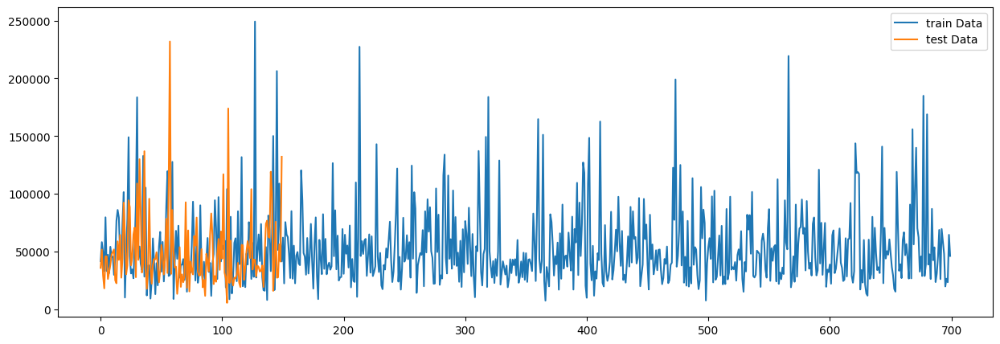

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,5))
plt.plot(train_X,train_Y,label="train Data")
plt.plot(test_X,test_Y,label="test Data")
plt.legend()


Best (p, d, q) values: (1, 1, 0)

Best (P, D, Q, S) values: (0, 1, 0, 12)

In [ ]:
model = sm.tsa.SARIMAX(train_Y,order=(1,1,0), seasonal_order=(0,1,0,12))
fitted_model = model.fit()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [ ]:
train_Y.tail()

Month
1958-03-01    362
1958-04-01    348
1958-05-01    363
1958-06-01    435
1958-07-01    491
Name: #Passengers, dtype: int64

In [ ]:
y_pred = fitted_model.get_forecast(steps=len(test_Y))

In [ ]:
forecast = fitted_model.get_prediction(start =" 1958-08-01" , end = "1961-12-01")

In [ ]:
forecast.predicted_mean

1958-08-01    490.337911
1958-09-01    427.883043
1958-10-01    370.771413
1958-11-01    328.794272
1958-12-01    359.789591
1959-01-01    363.790550
1959-02-01    341.790353
1959-03-01    385.790394
1959-04-01    371.790385
1959-05-01    386.790387
1959-06-01    458.790387
1959-07-01    514.790387
1959-08-01    514.128298
1959-09-01    451.673430
1959-10-01    394.561800
1959-11-01    352.584659
1959-12-01    383.579978
1960-01-01    387.580936
1960-02-01    365.580740
1960-03-01    409.580780
1960-04-01    395.580772
1960-05-01    410.580774
1960-06-01    482.580773
1960-07-01    538.580774
1960-08-01    537.918684
1960-09-01    475.463817
1960-10-01    418.352186
1960-11-01    376.375046
1960-12-01    407.370365
1961-01-01    411.371323
1961-02-01    389.371127
1961-03-01    433.371167
1961-04-01    419.371159
1961-05-01    434.371161
1961-06-01    506.371160
1961-07-01    562.371160
1961-08-01    561.709071
1961-09-01    499.254203
1961-10-01    442.142573
1961-11-01    400.165432


In [ ]:
forecast.summary_frame()

#Passengers,mean,mean_se,mean_ci_lower,mean_ci_upper
1958-08-01,490.337911,9.627948,471.467479,509.208342
1958-09-01,427.883043,12.301116,403.773299,451.992787
1958-10-01,370.771413,14.706555,341.947095,399.595731
1958-11-01,328.794272,16.730875,296.002360,361.586184
1958-12-01,359.789591,18.542707,323.446554,396.132629
1959-01-01,363.790550,20.191245,324.216437,403.364662
1959-02-01,341.790353,21.715250,299.229245,384.351462
1959-03-01,385.790394,23.139047,340.438694,431.142093
1959-04-01,371.790385,24.480184,323.810107,419.770664
1959-05-01,386.790387,25.751567,336.318244,437.262530


In [ ]:
df.tail()

,#Passengers
Month,
1960-08-01,606
1960-09-01,508
1960-10-01,461
1960-11-01,390
1960-12-01,432


In [ ]:
forecast = fitted_model.get_prediction(start =" 1960-12-01" , end = "1961-12-01")

In [ ]:
forecast.predicted_mean

1960-12-01    407.370365
1961-01-01    411.371323
1961-02-01    389.371127
1961-03-01    433.371167
1961-04-01    419.371159
1961-05-01    434.371161
1961-06-01    506.371160
1961-07-01    562.371160
1961-08-01    561.709071
1961-09-01    499.254203
1961-10-01    442.142573
1961-11-01    400.165432
1961-12-01    431.160751
Freq: MS, Name: predicted_mean, dtype: float64

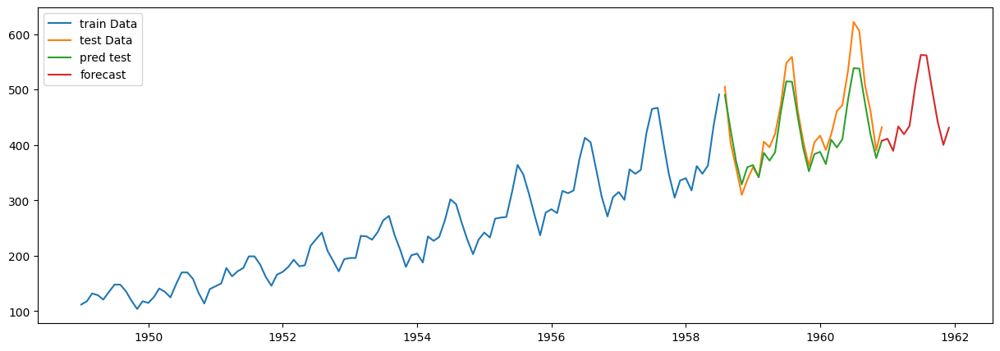

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,5))
plt.plot(train_X,train_Y,label="train Data")
plt.plot(test_X,test_Y,label="test Data")
plt.plot(test_X,y_pred.predicted_mean,label="pred test")
plt.plot(forecast.predicted_mean,label="forecast")
plt.legend()

In [ ]:
from sklearn.metrics import mean_absolute_error

In [ ]:
# Calculate the MAE
mae = mean_absolute_error(test_Y, y_pred.predicted_mean)

In [ ]:
mae

28.5474087597444